# Probabilistic Forecast Peak Hours 2008 - DIEGO CERDA - Amperon

In [1]:
# load dependencies
import pandas as pd
import plotly.graph_objects as go
import numpy as np
import xgboost as xgb
from xgboost import XGBClassifier
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
import holidays
from sklearn.metrics import (
    brier_score_loss,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
)
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
import warnings
warnings.filterwarnings('ignore')

# EDA - Feature Engineering

In [2]:
df_load = pd.read_csv('load_hist_data.csv')
# Combine date and hour into a single datetime column
df_load['timestamp'] = pd.to_datetime(df_load['Date']) + pd.to_timedelta(df_load['Hour'] - 1, unit='h')
df_load.set_index('timestamp', inplace=True)
df_load.drop(columns=['Date', 'Hour'], inplace=True)

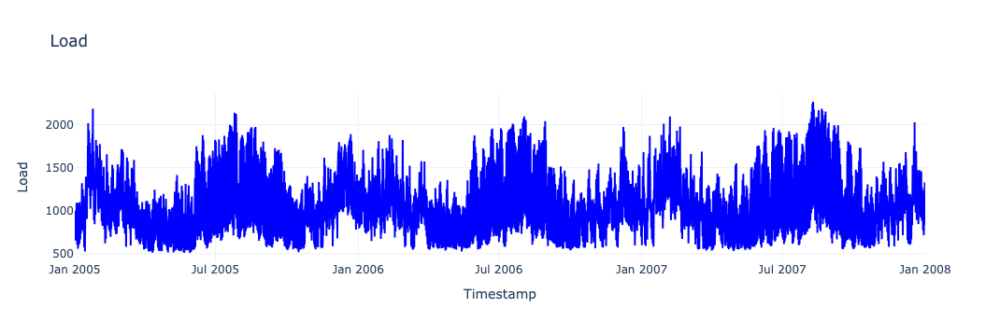

In [3]:
# Inspect raw data
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df_load.index,
    y=df_load.Load,
    mode='lines',
    name='df_load',
    line=dict(color='blue')
))

fig.update_layout(
    title="Load",
    xaxis_title="Timestamp",
    yaxis_title="Load",
    template="plotly_white",
    showlegend=False
)


fig.show()

In [4]:
# Function to assign the peak hour for each date
df_load['is_peak_hour'] = 0 

def assign_peak_hour(group):
    idx = group['Load'].idxmax()  # Find the timestamp of the max load
    group.loc[idx, 'is_peak_hour'] = 1  # Mark the peak hour
    return group

# Group by date (using the timestamp's date) and apply the function
df_load = df_load.groupby(df_load.index.date).apply(assign_peak_hour)

# Drop unnecessary index levels caused by groupby
df_load.index = df_load.index.droplevel(0)

# Ensure only the desired columns are present
df_load = df_load[['Load', 'is_peak_hour']]

I noticed that the weather data includes temperature readings up to 2008, which aligns with the year we aim to predict. For simplicity, I will use this data in the forecast. However, in a real-world scenario, such information would likely not be available. If it were, it might come from estimates, which could introduce noise into the forecast.

If this data were unavailable, I would need to generate a temperature forecast as well. A simple approach might involve estimating it based on past trends or integrating with tools like NOAA forecasts. There are also companies, such as NASA, that provide advanced and more accurate estimations.

Incorporating weather data is beneficial because it provides insights into potential consumption patterns. For instance, extremely hot weather could drive a surge in air conditioning usage, significantly spiking energy demand.

In [5]:
df_weather = pd.read_csv('weather_data.csv')
df_weather['timestamp'] = pd.to_datetime(df_weather['Date']) + pd.to_timedelta(df_weather['Hour'] - 1, unit='h')
#df_weather.set_index('timestamp', inplace=True)
df_weather.drop(columns=['Date', 'Hour'], inplace=True)
# Data contaits duplicates and
df_weather = df_weather.drop_duplicates(subset=['timestamp', 'Station ID'])
# Pivot the dataframe to create a column for each Station ID
df_weather = df_weather.pivot(index='timestamp', columns='Station ID', values='Temperature')

# Rename the columns for clarity
df_weather.columns = [f"Station {col}" for col in df_weather.columns]

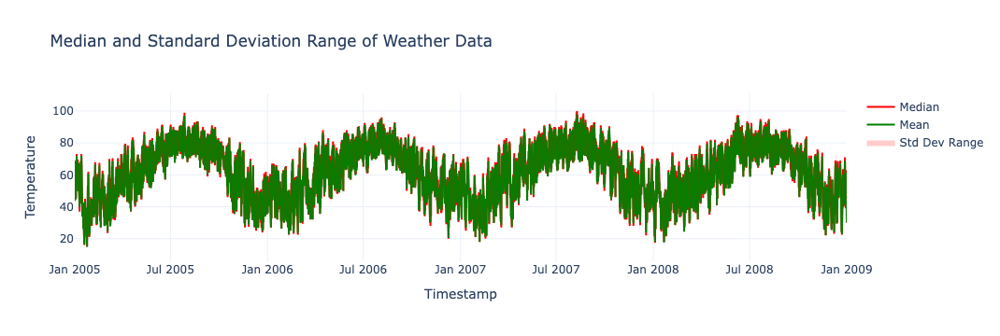

In [6]:
import plotly.graph_objects as go
import numpy as np

# Calculate the median and standard deviation across all station columns
median_values = df_weather.median(axis=1)
mean_values = df_weather.mean(axis=1)
std_values = df_weather.std(axis=1)
lower_limit = median_values - std_values
upper_limit = median_values + std_values

# Create the plotly figure
fig = go.Figure()

# Add the median line
fig.add_trace(go.Scatter(
    x=median_values.index,
    y=median_values,
    mode='lines',
    name='Median',
    line=dict(color='red')
))

fig.add_trace(go.Scatter(
    x=mean_values.index,
    y=mean_values,
    mode='lines',
    name='Mean',
    line=dict(color='green')
))

# Add the standard deviation fill
fig.add_trace(go.Scatter(
    x=lower_limit.index.tolist() + upper_limit.index.tolist()[::-1],
    y=lower_limit.tolist() + upper_limit.tolist()[::-1],
    fill='toself',
    fillcolor='rgba(255, 0, 0, 0.2)',  # Light red fill
    line=dict(color='rgba(255, 0, 0, 0)'),  # No border line
    name='Std Dev Range'
))

# Update layout
fig.update_layout(
    title="Median and Standard Deviation Range of Weather Data",
    xaxis_title="Timestamp",
    yaxis_title="Temperature",
    template="plotly_white",
    showlegend=True
)

# Show the plot
fig.show()


There is evident cyclic behavior in the data, and it's important to capture this in our features to improve the forecast accuracy.

Let’s proceed with some feature engineering on the weather data to represent these patterns effectively.

In [7]:
# Aggregate Temperature Data Across Stations
station_columns = [col for col in df_weather.columns if 'Station' in col]

df_weather['Avg_Temperature'] = df_weather[station_columns].mean(axis=1)
df_weather['Median_Temperature'] = df_weather[station_columns].median(axis=1)
df_weather['Max_Temperature'] = df_weather[station_columns].max(axis=1)
df_weather['Min_Temperature'] = df_weather[station_columns].min(axis=1)
df_weather['Temp_Range'] = df_weather['Max_Temperature'] - df_weather['Min_Temperature']
df_weather['Temp_StdDev'] = df_weather[station_columns].std(axis=1)
df_weather['Temp_25th_Percentile'] = df_weather[station_columns].quantile(0.25, axis=1)
df_weather['Temp_75th_Percentile'] = df_weather[station_columns].quantile(0.75, axis=1)

# Lag of 1 hour
df_weather['Avg_Temp_Lag1'] = df_weather['Avg_Temperature'].shift(1)
# Lag of 24 hours (same hour previous day)
df_weather['Avg_Temp_Lag24'] = df_weather['Avg_Temperature'].shift(24)
# Lag of 168 hours (same hour previous week)
df_weather['Avg_Temp_Lag168'] = df_weather['Avg_Temperature'].shift(168)

# Fill missing values (e.g., with the mean or forward fill)
df_weather['Avg_Temp_Lag1'].fillna(method='bfill', inplace=True)
df_weather['Avg_Temp_Lag24'].fillna(method='bfill', inplace=True)
df_weather['Avg_Temp_Lag168'].fillna(method='bfill', inplace=True)


In [8]:
from sklearn.decomposition import PCA
# Perform PCA
pca = PCA(n_components=5)
principal_components = pca.fit_transform(df_weather[station_columns])

# Add principal components to the dataframe
for i in range(5):
    df_weather[f'PC{i+1}'] = principal_components[:, i]

station_features= [col for col in df_weather.columns if 'Station'  not in col]

df = df_weather[station_features].join(df_load['is_peak_hour'], how='outer')

df.head()

,Avg_Temperature,Median_Temperature,Max_Temperature,Min_Temperature,Temp_Range,Temp_StdDev,Temp_25th_Percentile,Temp_75th_Percentile,Avg_Temp_Lag1,Avg_Temp_Lag24,Avg_Temp_Lag168,PC1,PC2,PC3,PC4,PC5,is_peak_hour
timestamp,,,,,,,,,,,,,,,,,
2005-01-01 00:00:00,46.107143,46.5,53,39,14,3.413907,44.00,48.00,46.107143,46.107143,46.107143,-78.923089,-2.410300,5.130152,-0.461511,1.884880,0.0
2005-01-01 01:00:00,45.964286,46.5,53,38,15,3.305239,45.00,48.00,46.107143,46.107143,46.107143,-79.586989,-1.147061,4.487582,1.526212,0.513935,0.0
2005-01-01 02:00:00,44.964286,45.0,52,37,15,3.271449,43.00,46.25,45.964286,46.107143,46.107143,-84.887448,-1.542823,7.117892,2.686950,1.177593,0.0
2005-01-01 03:00:00,45.178571,46.0,52,37,15,3.367091,43.75,47.00,44.964286,46.107143,46.107143,-83.683920,-2.463523,4.954768,3.288699,0.210600,0.0
2005-01-01 04:00:00,44.714286,45.0,51,37,14,3.609218,43.00,46.25,45.178571,46.107143,46.107143,-86.139698,-1.936711,6.381208,4.607895,0.807325,0.0


Lets temporal and cyclical features to capture time-based patterns and seasonality. It includes hour, day, month, and holiday indicators, along with sine and cosine transformations for cyclic behavior, ensuring smooth representation of trends and interactions with temperature data.

In [9]:
df['Hour'] = df.index.hour + 1  # Adjusting to 1-24
df['DayOfWeek'] = df.index.dayofweek  # Monday=0, Sunday=6
df['DayOfYear'] = df.index.dayofyear
df['Month'] = df.index.month
df['Is_Weekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)
# Define seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

# Create 'Season' feature
#df['Season'] = df['Month'].apply(get_season)
import holidays
us_holidays = holidays.UnitedStates(years=df.index.year.unique())
#df['Is_Holiday'] = pd.Series(df.index.date).isin(us_holidays).astype(int)
#df['Is_Pre_Holiday'] = pd.Series(df.index.date).isin([date - pd.Timedelta(days=1) for date in us_holidays]).astype(int)
#df['Is_Post_Holiday'] = pd.Series(df.index.date).isin([date + pd.Timedelta(days=1) for date in us_holidays]).astype(int)

# Hour of day cyclical transformation
df['Sin_Hour'] = np.sin(2 * np.pi * df['Hour'] / 24)
df['Cos_Hour'] = np.cos(2 * np.pi * df['Hour'] / 24)

# Day of year cyclical transformation
df['Sin_DayOfYear'] = np.sin(2 * np.pi * df['DayOfYear'] / 365)
df['Cos_DayOfYear'] = np.cos(2 * np.pi * df['DayOfYear'] / 365)

df['Temp_Sin_Hour'] = df['Avg_Temperature'] * df['Sin_Hour']
df['Temp_Cos_Hour'] = df['Avg_Temperature'] * df['Cos_Hour']
df['Temp_Sin_DayOfYear'] = df['Avg_Temperature'] * df['Sin_DayOfYear']
df['Temp_Cos_DayOfYear'] = df['Avg_Temperature'] * df['Cos_DayOfYear']

# Temperature extremes
df['Is_Hot_Day'] = (df['Avg_Temperature'] > df['Avg_Temperature'].quantile(0.9)).astype(int)
df['Is_Cold_Day'] = (df['Avg_Temperature'] < df['Avg_Temperature'].quantile(0.1)).astype(int)

# Hour-temperature interaction for peak hours
df['Peak_Hour_Temp'] = ((df['Hour'] >= 12) & (df['Hour'] <= 20)) * df['Avg_Temperature']
# Part of day
df['Is_Morning'] = ((df['Hour'] >= 6) & (df['Hour'] <= 11)).astype(int)
df['Is_Afternoon'] = ((df['Hour'] >= 12) & (df['Hour'] <= 17)).astype(int)
df['Is_Evening'] = ((df['Hour'] >= 18) & (df['Hour'] <= 23)).astype(int)

# Morning/Afternoon temperature interactions
df['Temp_Morning'] = df['Avg_Temperature'] * ((df['Hour'] >= 6) & (df['Hour'] <= 11))
df['Temp_Afternoon'] = df['Avg_Temperature'] * ((df['Hour'] >= 12) & (df['Hour'] <= 17))

# Temperature with time periods
df['Temp_Sin_DayOfWeek'] = df['Avg_Temperature'] * np.sin(2 * np.pi * df['DayOfWeek'] / 7)
df['Temp_Cos_DayOfWeek'] = df['Avg_Temperature'] * np.cos(2 * np.pi * df['DayOfWeek'] / 7)

# More temperature lags
df['Avg_Temp_Lag2'] = df['Avg_Temperature'].shift(2)
df['Avg_Temp_Lag3'] = df['Avg_Temperature'].shift(3)
df['Avg_Temp_Lag48'] = df['Avg_Temperature'].shift(48)

# Time period indicators
df['Is_Peak_Window'] = ((df['Hour'] >= 14) & (df['Hour'] <= 20)).astype(int)
df['Is_Business_Hours'] = ((df['Hour'] >= 9) & (df['Hour'] <= 17)).astype(int)

# Temperature changes
df['Temp_Change_1h'] = df['Avg_Temperature'].diff()
df['Temp_Change_3h'] = df['Avg_Temperature'].diff(3)

# Rolling statistics
df['Temp_Rolling_Mean_3h'] = df['Avg_Temperature'].rolling(window=3).mean()
df['Temp_Rolling_Max_24h'] = df['Avg_Temperature'].rolling(window=24).max()

df['Temp_Acceleration'] = df['Temp_Change_1h'].diff()
df['Temp_Rate_Change'] = df['Temp_Change_1h'] / df['Avg_Temperature']


***

### Model Training

* Uses 2 years (2005-2006) for training with cross-validation
* Uses 2007 as a hold-out validation set to evaluate model performance
* Reserves 2008 for final predictions as required by the challenge

In [10]:
# Create time-based splits for 2005-2006 data
tscv = TimeSeriesSplit(
    n_splits=3,
    test_size=24*30  # One month of hourly data as test size
)
X_train_cv = df.loc['2005':'2006'].drop(columns=['is_peak_hour'])  # 2 years training
y_train_cv = df.loc['2005':'2006']['is_peak_hour']

X_val = df.loc['2007'].drop(columns=['is_peak_hour'])  # 1 year validation
y_val = df.loc['2007'][['is_peak_hour']]

X_predict = df.loc['2008'].drop(columns=['is_peak_hour'])  # 1 year to predict

In [ ]:

# Calculate class weights with higher weight for peak hours
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.array([0, 1]),
    y=y_train_cv
)
class_weight_dict = {0: class_weights[0], 1: class_weights[1] * 3}

from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import randint

# Define smaller parameter space
param_dist = {
    'n_estimators': randint(50, 200),      # Fewer trees
    'max_depth': [10, 15, 20],             # Limited depth options
    'min_samples_split': randint(2, 6),     # Smaller range
    'min_samples_leaf': randint(1, 3)       # Smaller range
}

# Initialize base model
rf = RandomForestClassifier(
    random_state=42,
    class_weight='balanced',
    n_jobs=-1
)

# Configure RandomizedSearchCV with fewer iterations
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=20,                    # Fewer iterations
    cv=3,                         # Fewer CV splits
    scoring='neg_brier_score',    # Matches challenge scoring
    n_jobs=-1,
    verbose=1,
    random_state=42
)

# Fit the random search
random_search.fit(X_train_cv, y_train_cv)

# Get best model

best_estimator = {'class_weight': 'balanced', 'max_depth': 30, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 303}


best_rf_model = random_search.best_estimator_

In [11]:
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.array([0, 1]),
    y=y_train_cv
)

# Increase weight for peak hours (class 1) by a factor of 3-5
# This helps the model focus more on correctly identifying peak hours
class_weight_dict = {
    0: class_weights[0],
    1: class_weights[1] * 1.2  # Multiply peak hour weight by 3
}

In [12]:

best_rf_model = RandomForestClassifier(
    class_weight=class_weight_dict,
    max_depth=30,
    max_features='log2',
    min_samples_leaf=2,
    min_samples_split=2,
    n_estimators=303,
    random_state=42  # Ensure reproducibility
)

# Fit the model on the full training data
best_rf_model.fit(X_train_cv, y_train_cv)


RandomForestClassifier(class_weight={0: np.float64(0.5217391304347826),
                                     1: np.float64(14.399999999999999)},
                       max_depth=30, max_features='log2', min_samples_leaf=2,
                       n_estimators=303, random_state=42)

### Evaluation Metrics

In [13]:
# Predict probabilities on validation set
probabilities = best_rf_model.predict_proba(X_val)[:, 1]

# Evaluate the model
brier_score = brier_score_loss(y_val, probabilities)
print(f"Brier Score: {brier_score:.4f}")


Brier Score: 0.0249


Scores below 0.04 would indicate the model is performing better than random guessing.

This scoring mechanism already accounts for the inherent imbalance in the data structure, making traditional class imbalance techniques less relevant for this specific challenge


In [14]:
# After training your model
importances = best_rf_model.feature_importances_
feature_names = X_train_cv.columns

# Create a DataFrame for better visualization
importances_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
})

# Sort the features by importance
importances_df = importances_df.sort_values(by='Importance', ascending=False)
importances_df.head(10)

,Feature,Importance
16,Hour,0.084742
26,Temp_Cos_Hour,0.065114
25,Temp_Sin_Hour,0.061630
21,Sin_Hour,0.055149
22,Cos_Hour,0.054656
48,Temp_Acceleration,0.037535
49,Temp_Rate_Change,0.032666
34,Is_Evening,0.032421
44,Temp_Change_1h,0.029972
45,Temp_Change_3h,0.027015


In [ ]:
df_predictions = pd.DataFrame(columns=['Probability'], data = probabilities)
df_predictions.index = y_val.index

In [19]:
def adjust_daily_probabilities(df_predictions):
    adjusted_probs = []
    
    for date in df_predictions.index.normalize().unique():
        # Get predictions for current day using timestamp index
        day_probs = df_predictions.loc[date:date + pd.Timedelta(hours=23)]
        
        # Get original probabilities order
        sorted_indices = np.argsort(day_probs.values.flatten())[::-1]
        n_hours = len(day_probs)
        
        # Assign 0.95 to highest probability
        new_probs = np.zeros(n_hours)
        new_probs[sorted_indices[0]] = 0.95
        
        # Distribute remaining 0.05 proportionally to original probabilities
        remaining_probs = day_probs.values.flatten()[sorted_indices[1:]]
        remaining_probs = remaining_probs / remaining_probs.sum() * 0.05
        new_probs[sorted_indices[1:]] = remaining_probs
        
        adjusted_probs.extend(new_probs)
    
    return adjusted_probs

In [15]:
X_train_cv = df.loc['2005':'2007'].drop(columns=['is_peak_hour'])  
y_train_cv = df.loc['2005':'2007']['is_peak_hour']
X_predict = df.loc['2008'].drop(columns=['is_peak_hour'])
# Fit the model on the full training data
best_rf_model.fit(X_train_cv, y_train_cv)

RandomForestClassifier(class_weight={0: np.float64(0.5217391304347826),
                                     1: np.float64(14.399999999999999)},
                       max_depth=30, max_features='log2', min_samples_leaf=2,
                       n_estimators=303, random_state=42)

In [29]:
probabilities = best_rf_model.predict_proba(X_predict)[:, 1]
df_predictions = pd.DataFrame(columns=['Probability'], data = probabilities)
df_predictions.index = X_predict.index
df_predictions['Daily Peak Probability'] = adjust_daily_probabilities(df_predictions)
df_predictions['Date'] = df_predictions.index.date
df_predictions['Hour'] = df_predictions.index.hour + 1  # Convert to 1-24 format
df_predictions[['Date', 'Hour', 'Daily Peak Probability']].to_csv('probability_estimates.csv', index=False)